# Análise de Imagens de Sensoriamento Remoto

Artur Chiaperini Grover

-------

#### Bibliotecas

Neste trabalho iremos utilizar as bibliotecas ```PIL``` e ```numpy``` para manipular as imagens, e a biblioteca ```matplotlib``` para visualizar as imagens.

In [1]:
import PIL
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('ggplot')

%matplotlib inline

#### Definição de Funções

Nesta sessão estão definidas as funções que serã utilizadas ao longo do trabalho.

```resize2pan```:

* entrada: a imagem que terá suas dimensões modificadas (img) e a imagem da banda pan (pan)
* saída: imagem com dimensões modificadas

In [2]:
def resize2pan(img, pan):
    m_pan, n_pan = np.asarray(pan).shape
    
    img = img.resize((m_pan, n_pan), resample = PIL.Image.BICUBIC)
    
    return img

```histogram_info```:

* entrada: imagem, range e bins
* saída: informações do histograma

Função recebe a imagem, e calcula as frequências e divisão de bins do espectro da imagem.

In [3]:
def histogram_info(img, range_tuple = (0, 256), bins = 256):
    if isinstance(img, PIL.Image.Image):
        m, n = np.asarray(img).shape
        hist, bins = np.histogram(np.asarray(img), range = range_tuple, bins = bins)
    
    if isinstance(img, np.ndarray):
        m, n = img.shape
        hist, bins = np.histogram(img, range = range_tuple, bins = bins)
        
    hist = hist / np.float(m * n)
    center = (bins[:-1] + bins[1:]) / 2
    
    return hist, center

```img2double```:

* entreda: imagem
* saída: imagem convertida para float64 e normalizada

In [4]:
def img2double(img):
    return np.asarray(img).astype(np.float64)/np.max(np.asarray(img))

```hsv_pan_sharpening```:

* entrada: imagem e banda pan
* saída: imagem com correção pan

Usa o método de correção pela intensidade da banda ```PAN``` após a conversão de ```RGB``` para ```HSV```.

In [5]:
def hsv_pan_sharpening(img, pan):
    img = resize2pan(img, pan)
    
    img_hsv = img.convert('HSV')
    img_hsv = np.asarray(img_hsv)
    img_hsv.setflags(write = 1) # enable writing to replace value 
    img_hsv[:, :, 2] = np.asarray(pan)
    img_hsv = PIL.Image.fromarray(img_hsv, mode = 'HSV')
    img_pan = img_hsv.convert('RGB')
    
    return img_pan

```pca_pan_sharpening```:

* entreda: imagem e banda pan
* saída: imagem com correção pan por PCA

Usa o método PCA para fazer o ajuste de intensidade da imagem ```RGB```.

In [6]:
def pca_pan_sharpening(img, pan):
    '''
    Performes PAN-Sharpening with PCA:
    input -> rgb and pan images
    output -> rgb pan corrected image
    '''
    
    pan = img2double(pan)
    # resize img to pan band dimensions
    img = resize2pan(img, pan)
    img_array = img2double(img)
    
    # reshape image from (m_pan, n_pan, 3) to (m_pan * n_pan, 3)
    img_array = img_array.reshape(-1, 3)
    
    # compute covariance of image and normalize it (correlation)
    img_cov = np.cov(img_array.T)
    std = np.transpose([np.sqrt(np.diag(img_cov))])
    std = std @ std.T
    img_cov = img_cov / std
    
    # Use correlation to compute eigenvalues and eigenvectors
    # np.linalg.eig returns eigenvalues and eigenvectors in decreasing order
    eig_val, eig_vec = np.linalg.eig(img_cov)
    
    # coordinate transformation y = eig_vec @ image (PCA)
    y = (eig_vec @ img_array.T).T
    
    # replacemente of PC1 by pan band intensity
    pc1 = (pan.reshape(-1,1) - np.mean(pan))/np.std(pan) * \
        np.std(y[:, 0]) + np.mean(y[:, 0])
    
    y[:, 0] = pc1[:,0]
    x = (eig_vec.T @ y.T).T
    pca1 = (x[:,0].reshape((600, 600)) * 255).astype('uint8')
    pca1 = PIL.Image.fromarray(pca1)
    pca2 = (x[:,1].reshape((600, 600)) * 255).astype('uint8')
    pca2 = PIL.Image.fromarray(pca2)
    pca3 = (x[:,2].reshape((600, 600)) * 255).astype('uint8')
    pca3 = PIL.Image.fromarray(pca3)
    img_pca = PIL.Image.merge(mode = 'RGB', bands = [pca1, pca2, pca3])
    
    return img_pca

```atm_min_correction```:

* entrada: imagem e histograma da imagem
* saída: imagem com correção atmosférica aplicada

Usa o método de transladar o espectro da imagem pelo menor valor de afastamento.

In [7]:
def atm_min_correction(img, hist):
    offset = np.min(np.nonzero(hist[0]))
    img = np.asarray(img) - offset
    img.setflags(write = 1)
    
    img = PIL.Image.fromarray(img.astype('uint8'))
    
    return img

-------

## (1) PAN Sharpening

Adiante iremos realizar o PAN-Sharpening de duas formas diferentes para dois conjunto de bandas diferentes.

A banda ```PAN``` possui resolução maior que as bandas ```R```, ```G```, ```B``` e ```NIR```. O processo do PAN-Sharpening consiste em utilizar a alta resolução da banda ```PAN```, para aumentar a resolução das demais bandas.

O PAN-Sharpening pode ser realizado de diferentes formas, aqui iremos utilizar os dois procedimentos abaixo:

* Primeiro Método: Conversão para os sistema de cores ```HSV```.
* Segundo Método: **PCA**.

A seguir carregamos as diferentes bandas, e fazemos a visualização de cada uma delas.

In [8]:
r = PIL.Image.open('../images/sjc_red.png')
g = PIL.Image.open('../images/sjc_grn.png')
b = PIL.Image.open('../images/sjc_blu.png')
nir = PIL.Image.open('../images/sjc_nir.png')
pan = PIL.Image.open('../images/sjc_pan.png')

Uma vez com as imagens carregadas em memória, podemos ver a informação que está presente em cada banda. 

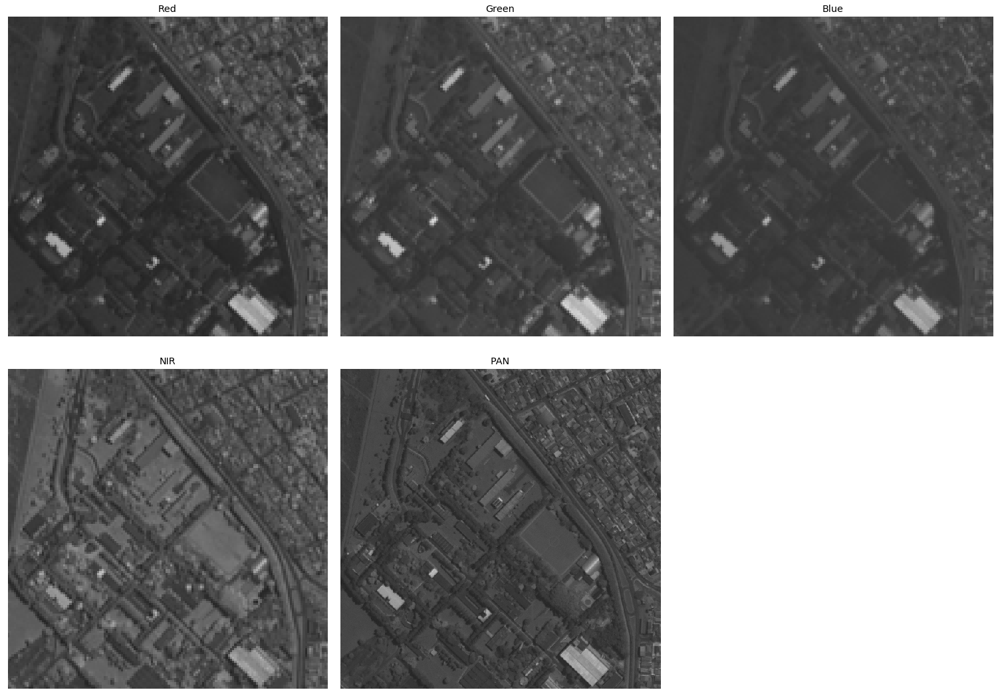

In [9]:
fig = plt.figure(figsize = (21,15))

plt.subplot(2, 3, 1)
plt.imshow(r, cmap = 'gray')
plt.title('Red')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 2)
plt.imshow(g, cmap = 'gray')
plt.title('Green')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 3)
plt.imshow(b, cmap = 'gray')
plt.title('Blue')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 4)
plt.imshow(nir, cmap = 'gray')
plt.title('NIR')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 5)
plt.imshow(pan, cmap = 'gray')
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

Pelas imagens acima, podemos ver que a banda ```PAN``` é mais nitida que as demais bandas. Isto acontece pois tem maior resolução.

Para realizar a conversão para do sistema de cores ```RGB``` para ```HSV```, primeiro precisamos juntar as bandas de interesse. A tabela abaixo mostra quais bandas iremos escolher para formar cada uma das imagens, isto é, para a primeira delas iremos colocar as bandas correspondentes para formar uma imagem ```RGB```, porém para a segunda iremos usar as bandas ```NIR``` (R), ```R``` (G) e ```G``` (B), 

|   R   |   G   |   B   |
|:-----:|:-----:|:-----:|
|```R```|```G```|```B```|
|```NIR```|```R```|```G```|

Abaixo criamos as duas imagens que passarão pelo PAN-Sharpening, que estão descritas na tabela acima.

In [10]:
rgb = PIL.Image.merge(mode = 'RGB', bands = [r, g, b])
nirrg = PIL.Image.merge(mode = 'RGB', bands = [nir, r, g])

Ao analizar as dimensões que de cada banda, vemos que a banda ```PAN```, tem dimensões maiores, devido a sua maior resolução.

In [11]:
print('Banda R shape - ', end = '')
print(np.asarray(r).shape)
print('Banda G shape - ', end = '')
print(np.asarray(g).shape)
print('Banda B shape - ', end = '')
print(np.asarray(b).shape)
print('Banda NIR shape - ', end = '')
print(np.asarray(nir).shape)
print('Banda PAN shape - ', end = '')
print(np.asarray(pan).shape)

Banda R shape - (150, 150)
Banda G shape - (150, 150)
Banda B shape - (150, 150)
Banda NIR shape - (150, 150)
Banda PAN shape - (600, 600)


Depois de carregar as imagens, para realizar o PAN-Sharpening, precisamos que as bandas ```R```, ```G```, ```B``` e ```NIR``` estejam com as mesmas dimensões que a banda ```PAN```.

Na célula de cima podemos ver que a banda ```PAN``` tem dimensões $(600, 600)$, enquanto que as demais bandas tem dimensões $(150, 150)$.

Inicialmente tinhamos apenas visualizado as bandas individualmente, agora abaixo podemos ver as imagens que criamos ao combinar as bandas.

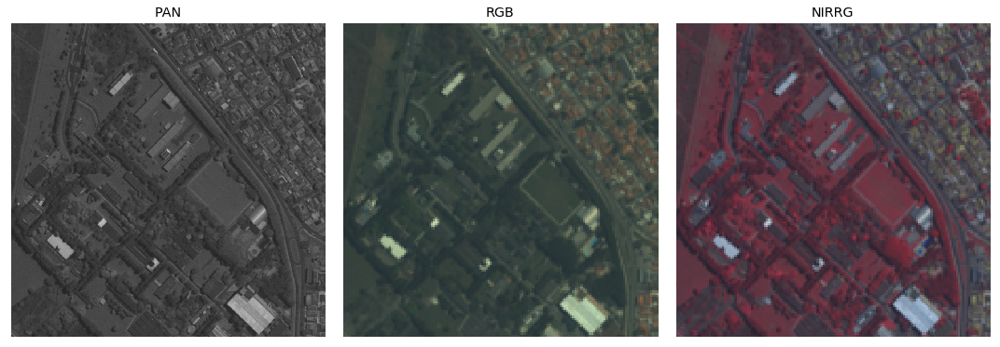

In [12]:
fig = plt.figure(figsize = (15,7))

plt.subplot(1, 3, 1)
plt.imshow(pan)
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 3, 2)
plt.imshow(rgb)
plt.title('RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 3, 3)
plt.imshow(nirrg)
plt.title('NIRRG')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

Na imagem com a banda ```NIR```, a vegetação tem um destaque em tonalidade vermelha, que auxilia a identificação de áreas com vegetação.

### (a) Primeiro Método: Conversão para o sistema de cores ```HSV```

Uma vez que as imagens foram preparadas, podemos dar sequência ao primeiro método, pela conversão de sistema de cores.

A função para realizar a operação já foi definida no início do trabalho, então agora apenas precisamos chamá-la para corrigir a imagem **rgb** e a **nirrg**.

In [13]:
rgb_hsv = hsv_pan_sharpening(rgb, pan)
nirrg_hsv = hsv_pan_sharpening(nirrg, pan)

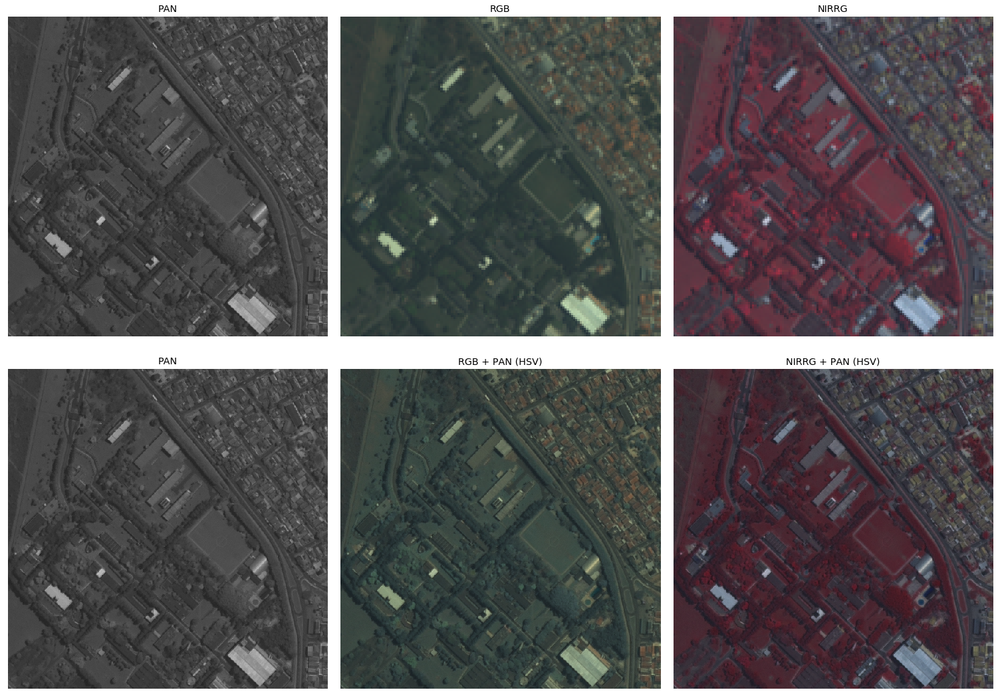

In [14]:
fig = plt.figure(figsize = (21,15))

plt.subplot(2, 3, 1)
plt.imshow(pan)
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 2)
plt.imshow(rgb)
plt.title('RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 3)
plt.imshow(nirrg)
plt.title('NIRRG')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 4)
plt.imshow(pan)
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 5)
plt.imshow(rgb_hsv)
plt.title('RGB + PAN (HSV)')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 6)
plt.imshow(nirrg_hsv)
plt.title('NIRRG + PAN (HSV)')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

As imagens acima mostram o resultado para as imagens com bandas ```RGB``` e ```NIRRG```, antes e depois do PAN-Sharpening. Como era esperado na segunda linha temos as imagens com a resolução maior, uma vez que estas imagens estão com as intensidades corridas pela banda ```PAN```.

-------

### (b) Segundo Método: **PCA**

Além da conversão para o sistema de cores ```HSV``` e substituição das intensidades da banda ```PAN``` nos valores de intensidade do ```HSV```, podemos realizar o PAN-Sharpening utilizando Análise de Componentes Principais (**PCA**).

In [15]:
r = PIL.Image.open('../images/sjc_red.png')
g = PIL.Image.open('../images/sjc_grn.png')
b = PIL.Image.open('../images/sjc_blu.png')
nir = PIL.Image.open('../images/sjc_nir.png')
pan = PIL.Image.open('../images/sjc_pan.png')

In [16]:
rgb = PIL.Image.merge(mode = 'RGB', bands = [r, g, b])
nirrg = PIL.Image.merge(mode = 'RGB', bands = [nir, r, g])

Depois de recarregar as imagens iniciais, podemos chamar as funções para fazer o PAN-Sharpening através do **PCA**.

In [17]:
rgb_pca = pca_pan_sharpening(rgb, pan)
nirrg_pca = pca_pan_sharpening(nirrg, pan)

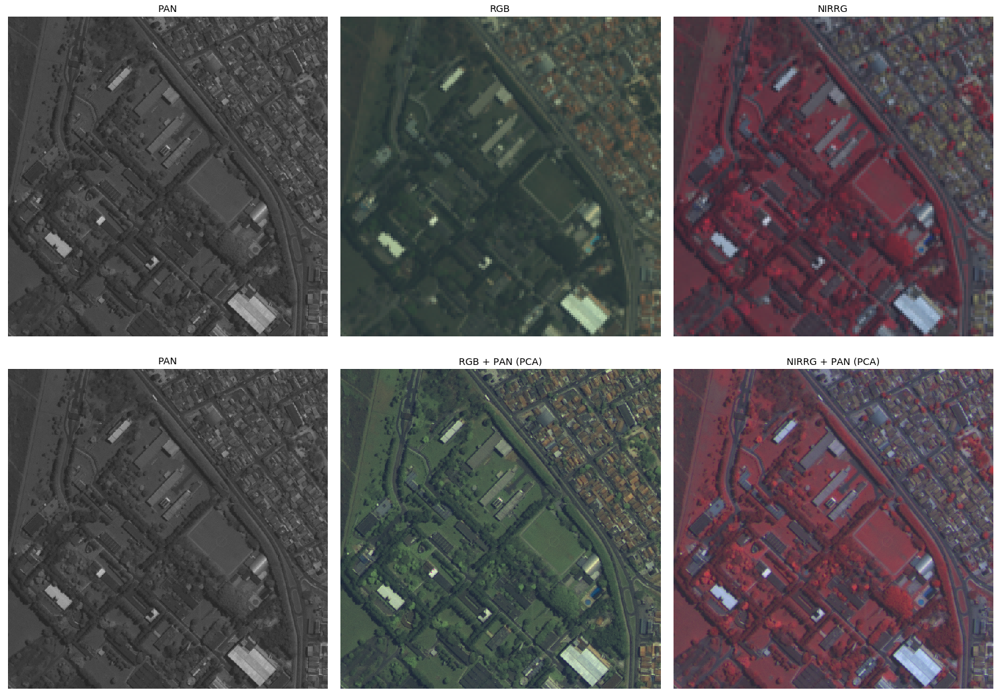

In [18]:
fig = plt.figure(figsize = (21,15))

plt.subplot(2, 3, 1)
plt.imshow(pan)
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 2)
plt.imshow(rgb)
plt.title('RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 3)
plt.imshow(nirrg)
plt.title('NIRRG')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 4)
plt.imshow(pan)
plt.title('PAN')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 5)
plt.imshow(rgb_pca)
plt.title('RGB + PAN (PCA)')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 6)
plt.imshow(nirrg_pca)
plt.title('NIRRG + PAN (PCA)')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

As imagens acima mostram o resultado do **PCA** em comparação com as imagens originais de entrada. Vemos que houve sucesso ao aplicar o método com **PCA**, uma vez que as imagens de saída apresentam a mesma resolução da banda ```PAN```.

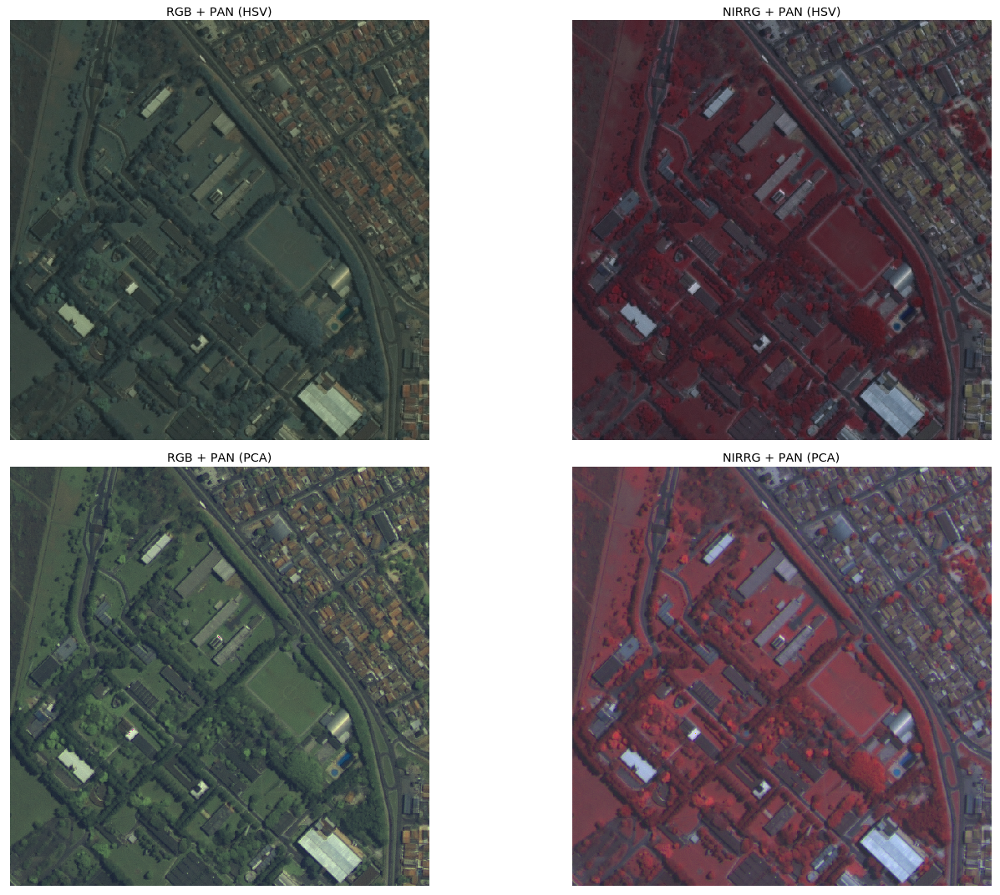

In [19]:
fig = plt.figure(figsize = (21,15))

plt.subplot(2, 2, 1)
plt.imshow(rgb_hsv)
plt.title('RGB + PAN (HSV)')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(nirrg_hsv)
plt.title('NIRRG + PAN (HSV)')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 3)
plt.imshow(rgb_pca)
plt.title('RGB + PAN (PCA)')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 4)
plt.imshow(nirrg_pca)
plt.title('NIRRG + PAN (PCA)')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

O PAN-Sharpening feito pela método do PCA resulta em uma imagem com maior brilho que o resultado do método HSV. Os histogramas abaixo mostram esse efeito; no primeiro temos o resultado do HSV convertido para escala de cinza, e no segundo, o resultado do PCA também convertido.

Podemos ver que o resultado do PCA tem uma distribuição com desvio padrão maior, e, consequentemente, maior contraste de intensidade, que o resultado do HSV. Abaixo temos os valores dos desvios padrões, na sequência HSV e PCA. E, na sequência, temos os histogramas da imagem **rgb** (em escala de cinza), onde podemos ver que pelo **PCA**, o espectro de intensidade é mais largo.

In [20]:
print('HSV - Desvio Padrão: ', end = '')
print(np.std(np.asarray(rgb_hsv.convert('L'))))
print('PCA - Desvio Padrão: ', end = '')
print(np.std(np.asarray(rgb_pca.convert('L'))))

HSV - Desvio Padrão: 16.639605073816654
PCA - Desvio Padrão: 21.947794104065316


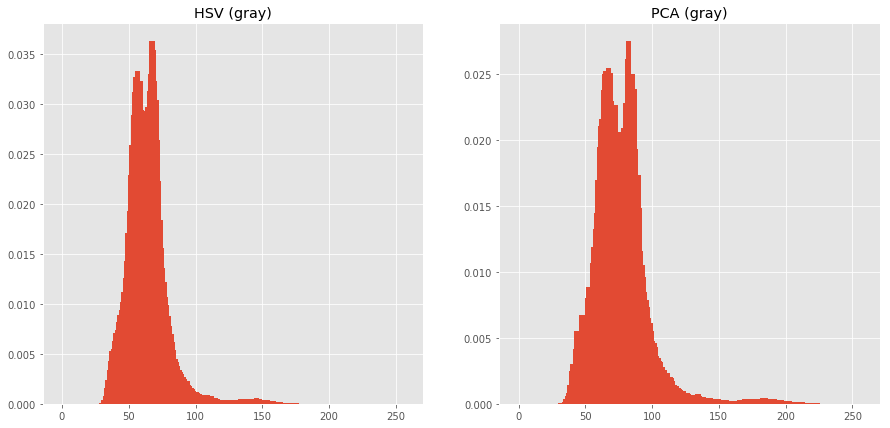

In [21]:
fig = plt.figure(figsize = (15, 7))

# HSV Histogram
hist_hsv = histogram_info(rgb_hsv.convert('L'))

plt.subplot(1, 2, 1)
plt.bar(hist_hsv[1], hist_hsv[0], align = 'center', width = 4)
plt.title('HSV (gray)')

# PCA Histogram
hist_pca = histogram_info(rgb_pca.convert('L'))

plt.subplot(1, 2, 2)
plt.bar(hist_pca[1], hist_pca[0], align = 'center', width = 4)
plt.title('PCA (gray)')

plt.show()

-------

## (2) Transformação Multiespectral

A razão entre a banda ```NIR``` e a banda ```R``` pode ser usada para delimitar áreas que tem vegetação, solo e água, da seguinte forma:
\begin{align}
\frac{g_{NIR}(x, y)}{g_{RED}(x, y)} 
\begin{cases}
\gg 1 & \mbox{Vegetação} \\
\approx 1 & \mbox{Solo} \\
< 1 & \mbox{Água} 
\end{cases}
\end{align}

In [22]:
maragojipe_rgb = PIL.Image.open('../images/maragojipe_rgb.tif')
maragojipe_nir = PIL.Image.open('../images/maragojipe_nir.tif')

A imagem maragojipe_rgb.tif, possui as três bandas ```R```, ```G``` e ```B```, podemos ver isso ao inspecionarmos o formado da imagem. Apenas precisamos da banda ```R```, e nas células abaixo fazemos a seleção apenas desta banda para prosseguir com a análise.

In [23]:
print('Maragojipe RGB shape - ', end = '')
print(np.asarray(maragojipe_rgb).shape)
print('Maragojipe NIR shape - ', end = '')
print(np.asarray(maragojipe_nir).shape)

Maragojipe RGB shape - (910, 1130, 3)
Maragojipe NIR shape - (910, 1130)


In [24]:
maragojipe_red_float = np.asarray(maragojipe_rgb)[:,:,0]
maragojipe_red_float = img2double(maragojipe_red_float)
maragojipe_nir_float = img2double(maragojipe_nir)

ratio = (maragojipe_nir_float / maragojipe_red_float)

Uma vez que calculamos a razão entre as bandas ```NIR``` e ```R```, podemos analizar o histograma 

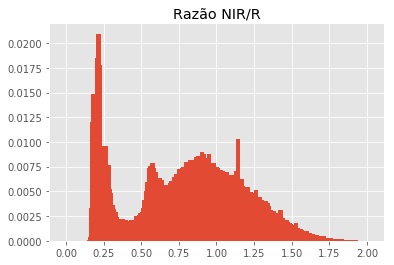

In [25]:
hist_mara = histogram_info(ratio, (0, 2))

plt.bar(hist_mara[1], hist_mara[0], align = 'center', width = 0.03)
plt.title('Razão NIR/R')
plt.show()

Pelo histograma acima, podemos definir algumas regiões a partir das quais iremos criar as máscaras para cada tipo de área. Analizando o gráfico do histograma acima, definimos as seguintes regiões:

* razão < 0.73: Água
* 0.73 <= razão < 1.001: Solo
* razão >= 1.001: Vegetação

Uma vez definido estes intervalos podemos criar as máscaras para cara área.

In [26]:
water_mask = ratio < 0.73
soil_mask = (ratio >= 0.73) & (ratio < 1.001)
vegetation_mask = ratio >= 1.001

In [27]:
water = ratio * water_mask
water[water != 0] = 1
soil = ratio * soil_mask
soil[soil != 0] = 1
vegetation = ratio * vegetation_mask
vegetation[vegetation != 0] = 1

In [28]:
ratio *= 255
ratio_img = PIL.Image.fromarray(ratio.astype('uint8'))

water *= 255
water_img = PIL.Image.fromarray(water.astype('uint8'))

soil *= 255
soil_img = PIL.Image.fromarray(soil.astype('uint8'))

vegetation *= 255
vegetation_img = PIL.Image.fromarray(vegetation.astype('uint8'))

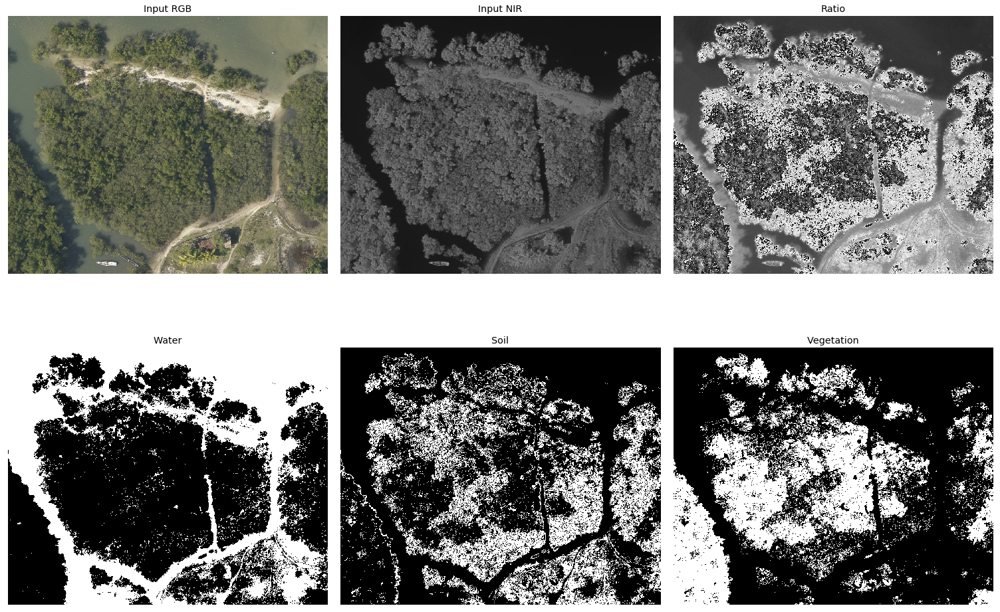

In [29]:
fig = plt.figure(figsize = (21, 15))

plt.subplot(2, 3, 1)
plt.imshow(maragojipe_rgb)
plt.title('Input RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 2)
plt.imshow(maragojipe_nir)
plt.title('Input NIR')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 3)
plt.imshow(ratio_img)
plt.title('Ratio')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 4)
plt.imshow(water_img)
plt.title('Water')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 5)
plt.imshow(soil_img)
plt.title('Soil')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 3, 6)
plt.imshow(vegetation_img)
plt.title('Vegetation')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

Nas imagens acima, as três imagens da segunda linha mostram as máscaras para cada um dos tipos de refletor: água, solo ou vegetação. Os pontos brancos indicam as áreas onde esses refletores se encontram, isto é, na imagem da máscara da água, a parte branca indica onde há água, e a mesma idéia se repete para os demais refletores.

O método de verificar a razão entre as intensidades da banda ```NIR``` e da banda ```R```, é um indicador inicial razoável para demarcar as regiões de interesse. Porém, nas três máscaras podemos ver que as regiões de cada um dos refletores não é bem definida. No caso da máscara da água, por exemplo, podemos ver que parte do solo, de areia branca, foi classificado como água.


-------

## (3) Índices de Vegetação

Em imagens de satelite, saber identificar a vegetação é de grande interesse. A boa indentificação da presença de vegetação, por exemplo, auxilia no monitoramento do desmatamento de áreas proibidas, que, em geral, são grandes e de difícil monitoramento direto.

A partir das bandas de saltelite podemos criar alguns índices que auxiliam na identificação da vegetação. Três desses índices são ```NDVI```, ```EVI``` e ```ARVI```. Tais índices se diferenciam na forma como combinam as bandas. Abaixo temos a equação para cada um dos itens:

* ```NDVI```:
$$
NDVI = \frac{NIR - R}{NIR + R}
$$
onde ```NIR``` e ```R``` correspondem às intensidades das bandas infra-vermelho e vermelho, respectivamente


* ```EVI```:
$$
EVI = 2.5\left(\frac{NIR - R}{NIR + 6R - 7.5B + 1}\right)
$$
onde ```B``` é a intensidade da banda azul.

* ```ARVI```:
$$
ARVI = \frac{NIR - 2R + B}{NIR + 2R - B}
$$

In [30]:
r = PIL.Image.open('../images/gavea_r.png')
g = PIL.Image.open('../images/gavea_g.png')
b = PIL.Image.open('../images/gavea_b.png')
nir = PIL.Image.open('../images/gavea_nir.png')

Selecionar apenas a primeira camada de cada imagem.

In [31]:
r, _, _, _ = r.split()
g, _, _, _ = g.split()
b, _, _, _ = b.split()
nir, _, _, _ = nir.split()

A seguir podemos visualizar cada uma das bandas.

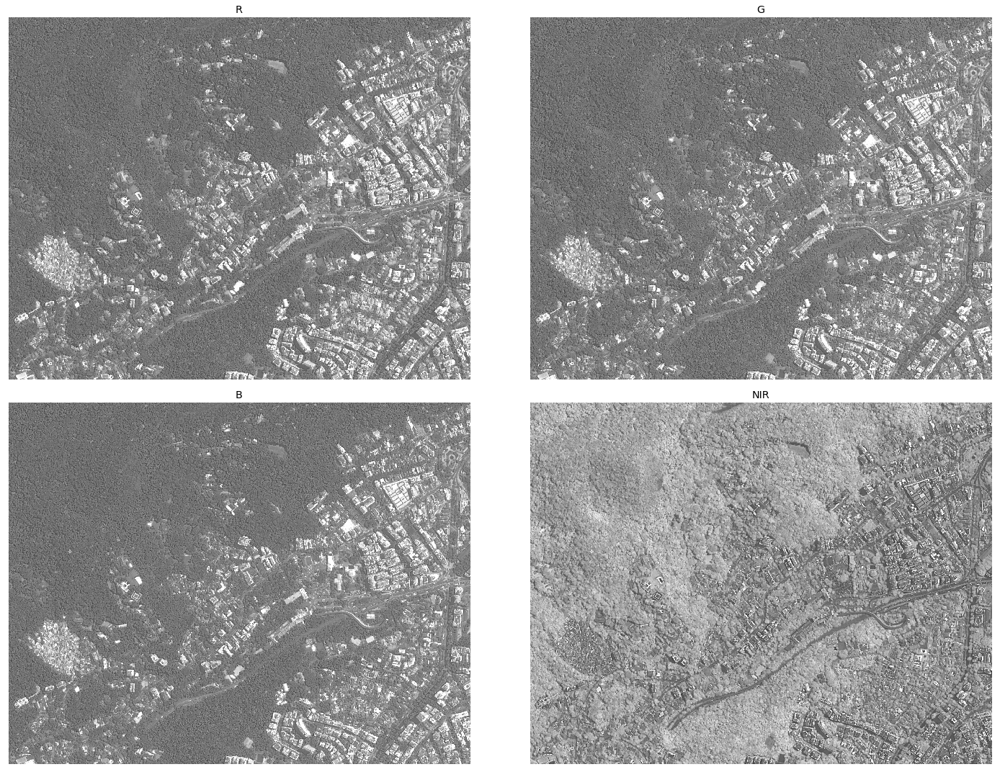

In [32]:
fig = plt.figure(figsize = (21, 15))

plt.subplot(2, 2, 1)
plt.imshow(r)
plt.title('R')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(g)
plt.title('G')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 3)
plt.imshow(b)
plt.title('B')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 4)
plt.imshow(nir)
plt.title('NIR')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

In [33]:
r_float = img2double(r)
g_float = img2double(g)
b_float = img2double(b)
nir_float = img2double(nir)

Assim, podemos calular cada um dos índices descritos acima. Aqui chamaremos as variáveis **ndvi_index**, **evi_index** e **arvi_index**, os respectivos índices para ```NDVI```, ```EVI``` e ```ARVI```.

In [49]:
ndvi_index = (nir_float - r_float)/(nir_float + r_float)

evi_index = 2.5 * (np.asarray(nir) - np.asarray(r)) / \
    (np.asarray(nir) + (6 * np.asarray(r)) - (7.5 * np.asarray(b)) + 1)

arvi_index = (nir_float - 2 * r_float + b_float) / \
    (nir_float + 2 * r_float - b_float)

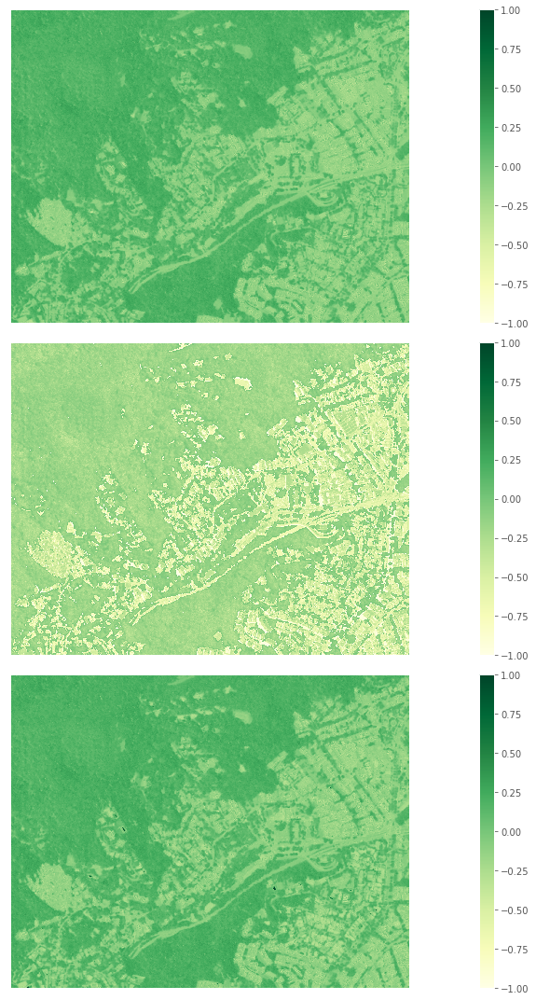

In [35]:
fig = plt.figure(figsize = (21, 15))

plt.subplot(3, 1, 1)
plt.imshow(ndvi_index, cmap = 'YlGn', vmin = -1, vmax = 1)
plt.xticks([])
plt.yticks([])
plt.colorbar()

plt.subplot(3, 1, 2)
plt.imshow(evi_index, cmap = 'YlGn', vmin = -1, vmax = 1)
plt.xticks([])
plt.yticks([])
plt.colorbar()

plt.subplot(3, 1, 3)
plt.imshow(arvi_index, cmap = 'YlGn', vmin = -1, vmax = 1)
plt.xticks([])
plt.yticks([])
plt.colorbar()

plt.tight_layout()
plt.show()

As imagens acima mostram o valor dos índices ```NDVI```, ```EVI``` e ```ARVI``` com escala limitada entre $-1$ e $1$.

Podemos criar uma máscara considerando que valores acima de $0$ é onde há vegetação, para os índices ```NDVI``` e ```ARVI```, enquanto que para o ```EVI```, iremos considerar valores acima de $-0.5$. Abaixo definimos essas máscaras e aplicamos as máscaras à imagem ```RGB```, onde apenas as áreas com vegetação serão preservadas.

In [36]:
ndvi_mask = ndvi_index > 0
evi_mask = evi_index > -0.5
arvi_mask = arvi_index > 0

In [37]:
rgb = PIL.Image.merge(mode = 'RGB', bands = [r, g, b])

In [38]:
ndvi = np.asarray(rgb) * np.repeat(ndvi_mask[:,:,np.newaxis], 3, axis = 2)
evi = np.asarray(rgb) * np.repeat(evi_mask[:,:,np.newaxis], 3, axis = 2)
arvi = np.asarray(rgb) * np.repeat(arvi_mask[:,:,np.newaxis], 3, axis = 2)

In [39]:
ndvi_img = PIL.Image.fromarray(ndvi, mode = 'RGB')
evi_img = PIL.Image.fromarray(evi, mode = 'RGB')
arvi_img = PIL.Image.fromarray(arvi, mode = 'RGB')

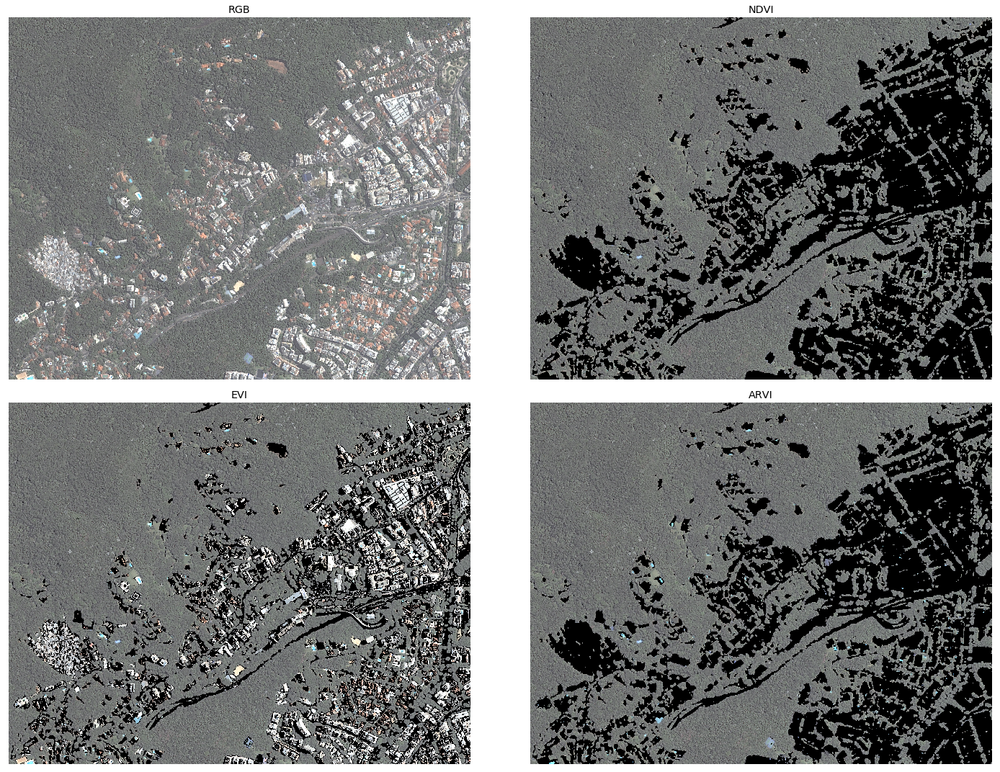

In [40]:
fig = plt.figure(figsize = (21, 15))

plt.subplot(2, 2, 1)
plt.imshow(rgb)
plt.title('RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(ndvi_img)
plt.title('NDVI')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 3)
plt.imshow(evi_img)
plt.title('EVI')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 4)
plt.imshow(arvi_img)
plt.title('ARVI')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

O limiar para considerar a vegetação foi criado de forma grosseira, apesar disso, podemos ver pelas imagens acima, que pelo índice ```NDVI```, a vegetação é melhor separada dos demais elementos da imagem. Não temos o mesmo resultado para os índices ```EVI``` e ```ARVI```.

Para a imagem final do índice ```EVI```, podemos ver claramente mais elementos que apenas vegetação.

Os resultados para ```NDVI``` e ```ARVI``` servem para dar uma noção inicial de onde há vegetação. Um processamento mais refinado deveria ser feito para se chegar a uma conclusão final.

-------

## (4) Correção Atmosférica

Utilizando as bandas de maragojipe, agora iremos aplicar a correção atmosférica através da translação baseado no mínimo do histograma. Para isso precisamos analisar o histograma de cada uma das bandas ```R```, ```G```, ```B``` e ```NIR```, determinar o seu respectivo afastamento mínimo, e transladar cada banda.

In [41]:
maragojipe_rgb = PIL.Image.open('../images/maragojipe_rgb.tif')
maragojipe_nir = PIL.Image.open('../images/maragojipe_nir.tif')

r, g, b = maragojipe_rgb.split()
nir = maragojipe_nir

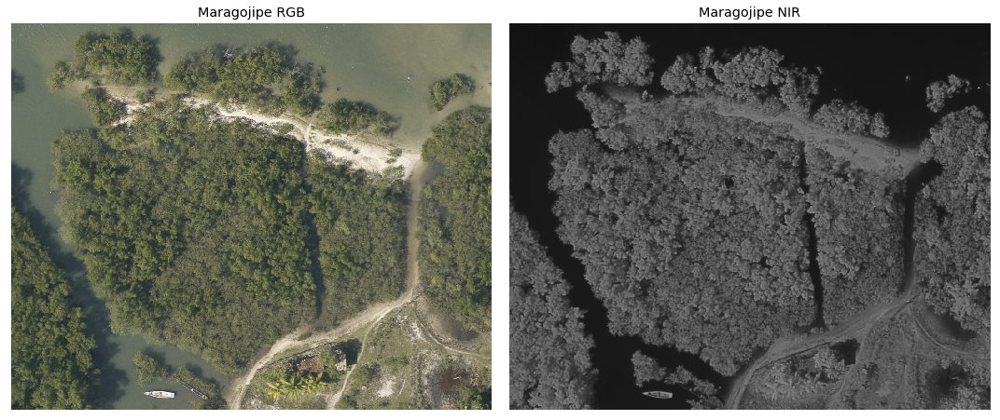

In [42]:
fig = plt.figure(figsize = (15, 7))

plt.subplot(1, 2, 1)
plt.imshow(maragojipe_rgb)
plt.title('Maragojipe RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(maragojipe_nir)
plt.title('Maragojipe NIR')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

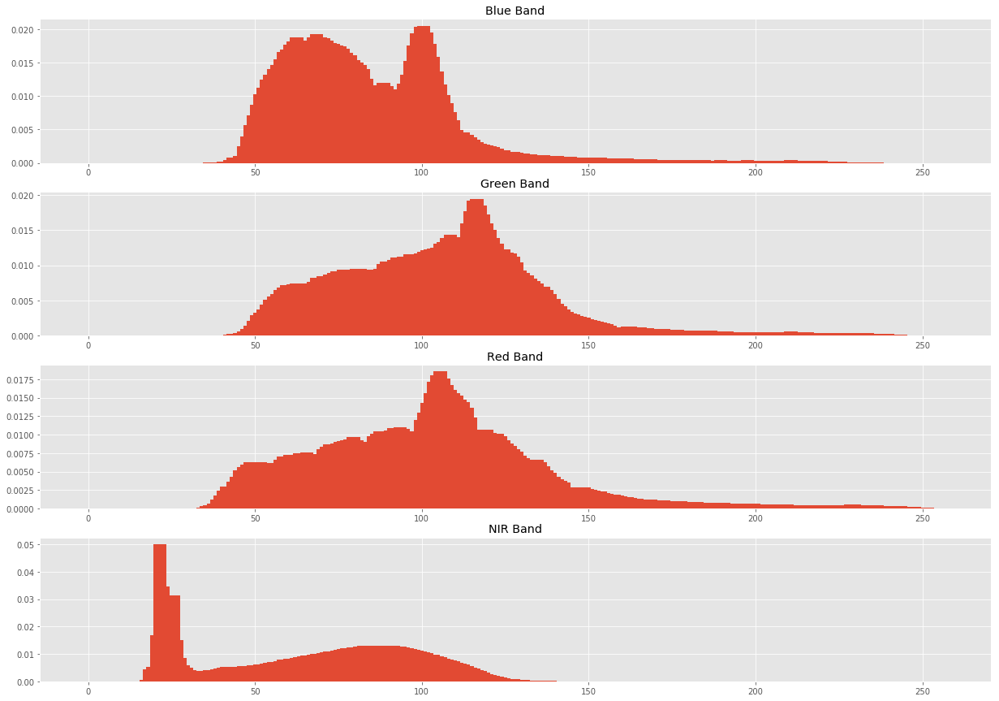

In [43]:
fig = plt.figure(figsize = (21, 15))

# Histogram Blue
hist_b = histogram_info(b, (0, 256))

plt.subplot(4, 1, 1)
plt.bar(hist_b[1], hist_b[0], align = 'center', width = 4)
plt.title('Blue Band')

# Histogram Green
hist_g = histogram_info(g, (0, 256))

plt.subplot(4, 1, 2)
plt.bar(hist_g[1], hist_g[0], align = 'center', width = 4)
plt.title('Green Band')

# Histogram Red
hist_r = histogram_info(r, (0, 256))

plt.subplot(4, 1, 3)
plt.bar(hist_r[1], hist_r[0], align = 'center', width = 4)
plt.title('Red Band')

# Histogram NIR
hist_nir = histogram_info(nir, (0, 256))

plt.subplot(4, 1, 4)
plt.bar(hist_nir[1], hist_nir[0], align = 'center', width = 4)
plt.title('NIR Band')

plt.show()

Acima podemos ver os histogramas para cada uma das bandas. Pelos histogramas vemos que cada banda possui um afastamento diferente, e este afastamento corresponde ao índice do primeiro valor diferente de zero. Uma vez determinado o afastamento, ele é subtraido da imagem.

In [44]:
r_atm = atm_min_correction(r, hist_r)
g_atm = atm_min_correction(g, hist_g)
b_atm = atm_min_correction(b, hist_b)
nir_atm = atm_min_correction(nir, hist_nir)

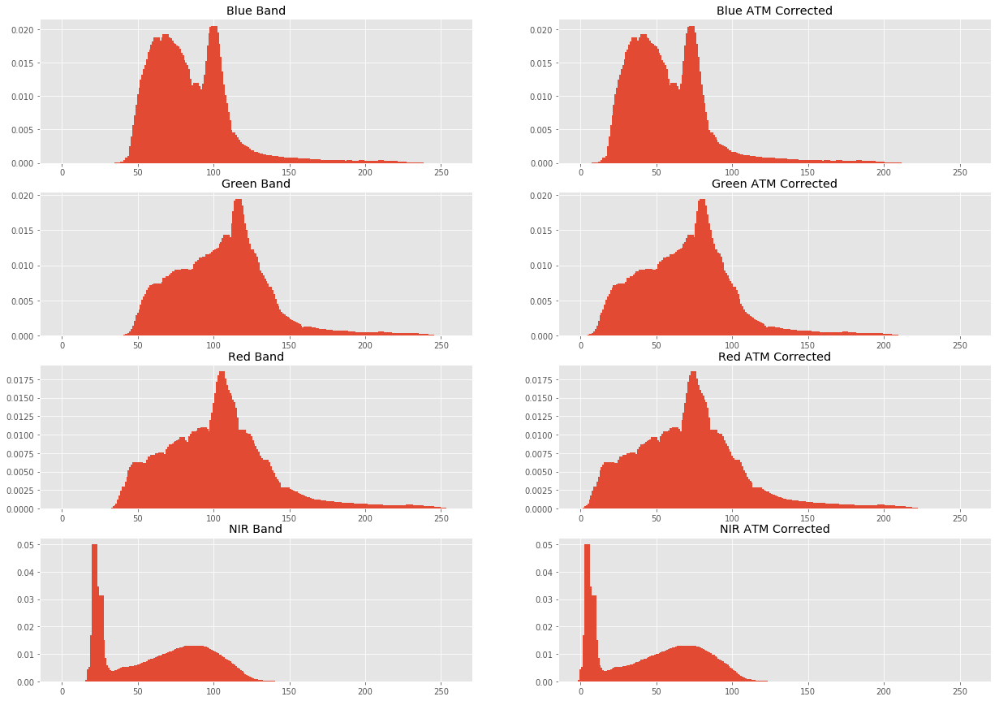

In [45]:
fig = plt.figure(figsize = (21, 15))

# Histogram Blue
hist_b_atm = histogram_info(b_atm)

plt.subplot(4, 2, 1)
plt.bar(hist_b[1], hist_b[0], align = 'center', width = 4)
plt.title('Blue Band')
plt.subplot(4, 2, 2)
plt.bar(hist_b_atm[1], hist_b_atm[0], align = 'center', width = 4)
plt.title('Blue ATM Corrected')

# Histogram Green
hist_g_atm = histogram_info(g_atm)

plt.subplot(4, 2, 3)
plt.bar(hist_g[1], hist_g[0], align = 'center', width = 4)
plt.title('Green Band')
plt.subplot(4, 2, 4)
plt.bar(hist_g_atm[1], hist_g_atm[0], align = 'center', width = 4)
plt.title('Green ATM Corrected')

# Histogram Red
hist_r_atm = histogram_info(r_atm)

plt.subplot(4, 2, 5)
plt.bar(hist_r[1], hist_r[0], align = 'center', width = 4)
plt.title('Red Band')
plt.subplot(4, 2, 6)
plt.bar(hist_r_atm[1], hist_r_atm[0], align = 'center', width = 4)
plt.title('Red ATM Corrected')

# Histogram NIR
hist_nir_atm = histogram_info(nir_atm)

plt.subplot(4, 2, 7)
plt.bar(hist_nir[1], hist_nir[0], align = 'center', width = 4)
plt.title('NIR Band')
plt.subplot(4, 2, 8)
plt.bar(hist_nir_atm[1], hist_nir_atm[0], align = 'center', width = 4)
plt.title('NIR ATM Corrected')
                        
plt.show()

Uma vez que a correção atmosférica foi executada, podemos analizar novamente os histogramas para cada banda, e ver agora que todas as bandas começam em zero.

In [46]:
maragojipe_atm = PIL.Image.merge(mode = 'RGB', bands = [r_atm, g_atm, b_atm])

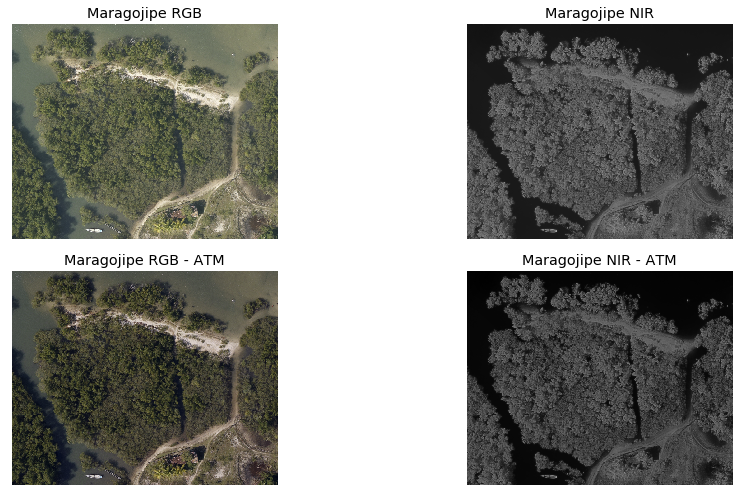

In [47]:
fig = plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
plt.imshow(maragojipe_rgb)
plt.title('Maragojipe RGB')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(maragojipe_nir)
plt.title('Maragojipe NIR')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 3)
plt.imshow(maragojipe_atm)
plt.title('Maragojipe RGB - ATM')
plt.xticks([])
plt.yticks([])

plt.subplot(2, 2, 4)
plt.imshow(nir_atm)
plt.title('Maragojipe NIR - ATM')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

Analizando as imagens, vemos que após a correção atmosférica, elas ficam mais escuras. Tal resultado era esperado, pois pelo histograma vemos que a intensidade para cada banda foi deslocado para valores mais baixos.